# 時系列データコンペ

- コンペ

https://www.kaggle.com/c/competitive-data-science-predict-future-sales

- 参考ノートブック

https://www.kaggle.com/jagangupta/time-series-basics-exploring-traditional-ts/notebook

## Import

In [1]:
# Basic packages
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random as rd # generating random numbers
import datetime # manipulating date formats
from dateutil.relativedelta import relativedelta

# Viz
import matplotlib.pyplot as plt # basic plotting
import seaborn as sns # for prettier plots
import japanize_matplotlib

# TIME SERIES
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs


# settings
import warnings
warnings.filterwarnings("ignore")

# logging
import logging
consoleHandler = logging.StreamHandler()
consoleHandler.setLevel(logging.WARNING)

/Users/kazuya/.local/share/virtualenvs/Kaggle-hrsqS2oW/lib/python3.9/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


## データ読み込み

In [2]:
df_sales = pd.read_csv('./data/input/sales_train.csv')
df_item_cat = pd.read_csv('./data/input/item_categories.csv')
df_item = pd.read_csv('./data/input/items.csv')
df_sub = pd.read_csv('./data/input/sample_submission.csv')
df_shop = pd.read_csv('./data/input/shops.csv')
df_test = pd.read_csv('./data/input/test.csv')

In [3]:
# データの型変換
df_sales.date = df_sales.date.apply(lambda x:datetime.datetime.strptime(x,'%d.%m.%Y'))
print(df_sales.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2935849 entries, 0 to 2935848
Data columns (total 6 columns):
 #   Column          Dtype         
---  ------          -----         
 0   date            datetime64[ns]
 1   date_block_num  int64         
 2   shop_id         int64         
 3   item_id         int64         
 4   item_price      float64       
 5   item_cnt_day    float64       
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 134.4 MB
None


In [4]:
# 月・店・商品で日付・価格・商品数量の集計
df_monthly_sales = df_sales.groupby(['date_block_num','shop_id','item_id'])['date','item_price','item_cnt_day'].agg({'date':['min','max'],'item_price':'mean','item_cnt_day':'sum'})
df_monthly_sales.head(20)

date            item_price item_cnt_day
                                      min        max       mean          sum
date_block_num shop_id item_id                                              
0              0       32      2013-01-03 2013-01-31      221.0          6.0
                       33      2013-01-03 2013-01-28      347.0          3.0
                       35      2013-01-31 2013-01-31      247.0          1.0
                       43      2013-01-31 2013-01-31      221.0          1.0
                       51      2013-01-13 2013-01-31      128.5          2.0
                       61      2013-01-10 2013-01-10      195.0          1.0
                       75      2013-01-17 2013-01-17       76.0          1.0
                       88      2013-01-16 2013-01-16       76.0          1.0
                       95      2013-01-06 2013-01-06      193.0          1.0
                       96      2013-01-10 2013-01-10       70.0          1.0
                       98      2013-01-04 2013-01-31      268.0         25.0
                       111     2013-01-17 2013-01-17       89.0          1.0
                       149     2013-01-11 2013-01-28       99.0          3.0
                       151     2013-01-16 2013-01-16       75.0          1.0
                       153     2013-01-09 2013-01-09      258.0          1.0
                       198     2013-01-10 2013-01-10      112.0          1.0
                       210     2013-01-05 2013-01-25      118.0          2.0
                       282     2013-01-04 2013-01-04      109.0          1.0
                       306     2013-01-22 2013-01-22       59.0          1.0
                       351     2013-01-21 2013-01-21       89.0          1.0

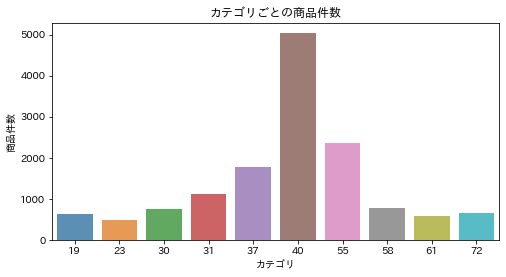

In [5]:
# カテゴリごとの商品件数
x = df_item.groupby(['item_category_id']).count()
x = x.sort_values(by='item_id',ascending=False)
x = x.iloc[0:10].reset_index()
x

# plot
plt.figure(figsize=(8,4))
ax = sns.barplot(x.item_category_id,x.item_id,alpha=0.8)
plt.title('カテゴリごとの商品件数')
plt.ylabel('商品件数')
plt.xlabel('カテゴリ')
plt.show()

Of course, there is a lot more that we can explore in this dataset, but let's dive into the time-series part.

# Single series:

The objective requires us to predict sales for the next month at a store-item combination.

Sales over time of each store-item is a time-series in itself. Before we dive into all the combinations, first let's understand how to forecast for a single series.

I've chosen to predict for the total sales per month for the entire company.

First let's compute the total sales per month and plot that data.


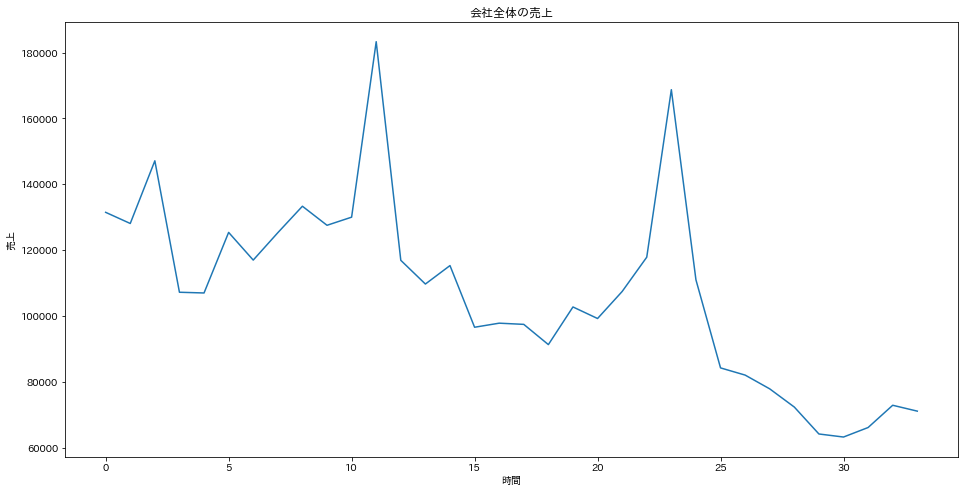

In [6]:
df_ts = df_sales.groupby(['date_block_num'])['item_cnt_day'].sum()
df_ts.astype('float')
plt.figure(figsize=(16,8))
plt.title('会社全体の売上')
plt.xlabel('時間')
plt.ylabel('売上')
plt.plot(df_ts)

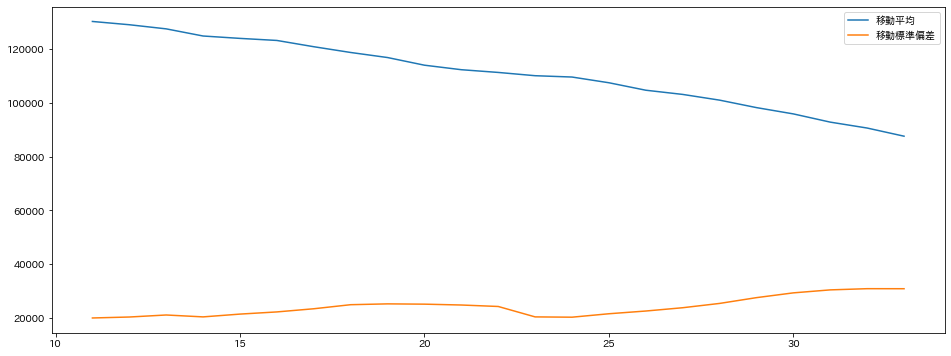

In [7]:
plt.figure(figsize=(16,6))
plt.plot(df_ts.rolling(window=12,center=False).mean(),label='移動平均')
plt.plot(df_ts.rolling(window=12,center=False).std(),label='移動標準偏差')
plt.legend()

**Quick observations:**
There is an obvious "seasonality" (Eg: peak sales around a time of year) and a decreasing "Trend".

Let's check that with a quick decomposition into Trend, seasonality and residuals.


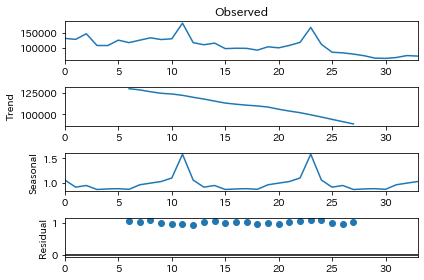

In [8]:
import statsmodels.api as sm

# 時系列データを基本成分に分解する。
res = sm.tsa.seasonal_decompose(df_ts.values,period=12,model='multiplicative')
fig = res.plot()

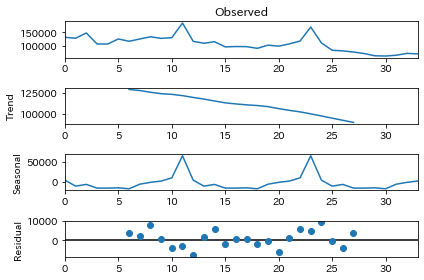

In [9]:
# 時系列データを基本成分に分解する。
res = sm.tsa.seasonal_decompose(df_ts.values,period=12,model='addtive')
fig = res.plot()

In [10]:
# 定常性の確認
def test_stationarity(timeseries):
    # Dickey-Fuller検定
    dftest = adfuller(timeseries,autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

# この時点でDF検定する。
test_stationarity(df_ts)

Test Statistic                 -2.395704
p-value                         0.142953
#Lags Used                      0.000000
Number of Observations Used    33.000000
Critical Value (1%)            -3.646135
Critical Value (5%)            -2.954127
Critical Value (10%)           -2.615968
dtype: float64


In [11]:
from pandas import Series as Series

# 指定の時間分だけずらしたときの差のシリーズを作成する。
def difference(dataset,interval=1):
    diff = list()
    for i in range(interval,len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)

# 差を反転する。?
def inverse_difference(last_ob,value):
    return value + last_ob

[]

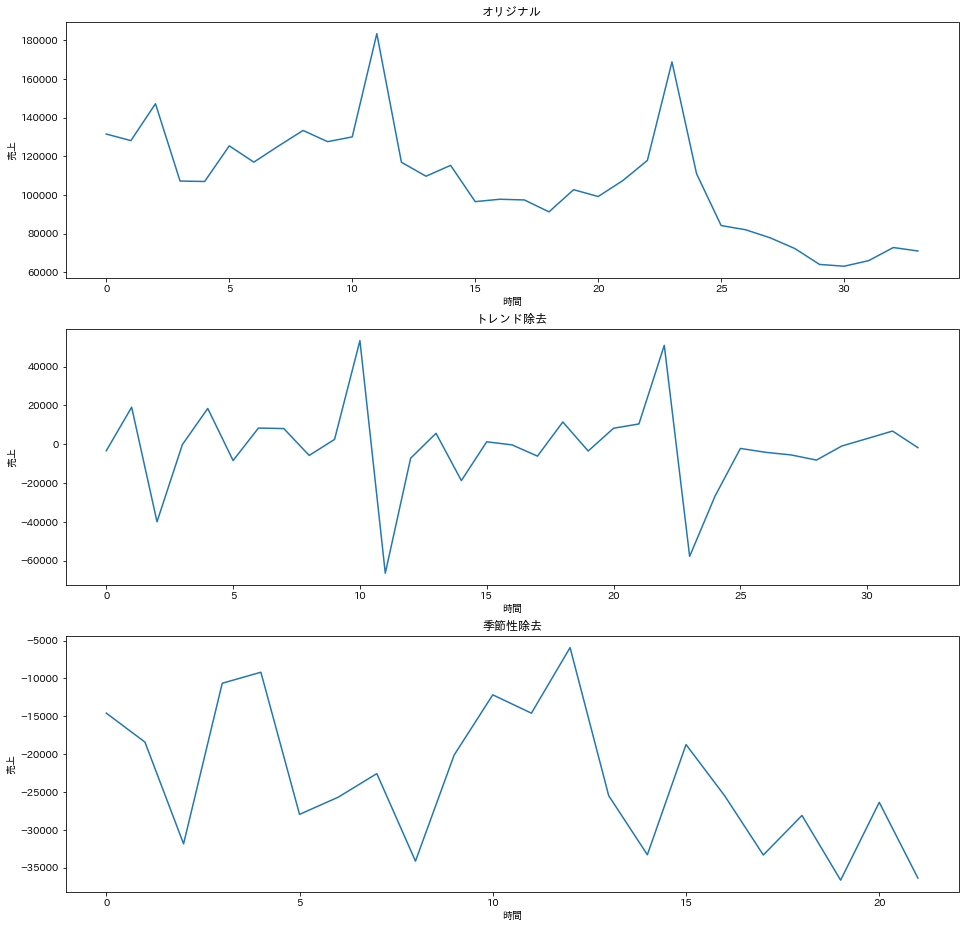

In [12]:
plt.figure(figsize=(16,16))
plt.subplot(311)
plt.title('オリジナル')
plt.xlabel('時間')
plt.ylabel('売上')
plt.plot(df_ts)

plt.subplot(312)
plt.title('トレンド除去')
plt.xlabel('時間')
plt.ylabel('売上')
df_ts_new = difference(df_ts)
plt.plot(df_ts_new)
plt.plot()

plt.subplot(313)
plt.title('季節性除去')
plt.xlabel('時間')
plt.ylabel('売上')
df_ts_new = difference(df_ts,12)
plt.plot(df_ts_new)
plt.plot()


In [13]:
# 季節性を除いたデータフレームで定常性を確認する。
test_stationarity(df_ts_new)

Test Statistic                 -3.270101
p-value                         0.016269
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64


### Now after the transformations, our p-value for the DF test is well within 5 %. Hence we can assume Stationarity of the series

We can easily get back the original series using the inverse transform function that we have defined above.

Now let's dive into making the forecasts!

# AR, MA and ARMA models:
TL: DR version of the models:

MA - Next value in the series is a function of the average of the previous n number of values
AR - The errors(difference in mean) of the next value is a function of the errors in the previous n number of values
ARMA - a mixture of both.

Now, How do we find out, if our time-series in AR process or MA process?

Let's find out!

In [14]:
# def tsplot(y,lags=None,figsize=(10,8),style='bmh',title=''):
#     if not isinstance(y,pd.Series):
#         y = pd.Series(y)
#     with plt.style.context(style):
#         fig = plt.figure(figsize=figsize)
#         layout = (3,2)
#         ts_ax = plt.subplot2grid(layout,(0,0),colspan=2)
#         acf_ax = plt.subplot2grid(layout,(1,0))
#         pacf_ax = plt.subplot2grid(layout,(1,1))        
#         qq_ax = plt.subplot2grid(layout,(2,0))        
#         pp_ax = plt.subplot2grid(layout,(2,1))
        
#         y.plot(ax=ts_ax)
#         ts_ax.set_title(title)
#         smt.graphics.plot_acf(y,lags=lags,ax=acf_ax,alpha=0.5)
#         smt.graphics.plot_pacf(y,lags=lags,ax=pacf_ax,alpha=0.5)
#         sm.qqplot(y,line='s',ax=qq_ax)
#         qq_ax.set_title('QQ Plot')
#         scs.problot(y,sparams=(y.mean(),y.std()),plot=pp_ax)
        
#         plt.tight_layout()
#     return
        


In [15]:
# # AR(1) のシミュレーション
# np.random.seed(1)
# n_samples = int(1000)
# a = 0.6
# x = w = np.random.normal(size=n_samples)

# for t in range(n_samples):
#     x[t] = a*x[t-1] + w[t]
# limit=12    
# _ = tsplot(x, lags=limit,title="AR(1)process")

In [16]:
# adding the dates to the Time-series as index
df_ts=df_sales.groupby(["date_block_num"])["item_cnt_day"].sum()
df_ts.index=pd.date_range(start = '2013-01-01',end='2015-10-01', freq = 'MS')
df_ts=df_ts.reset_index()
df_ts

,index,item_cnt_day
0,2013-01-01,131479.0
1,2013-02-01,128090.0
2,2013-03-01,147142.0
3,2013-04-01,107190.0
4,2013-05-01,106970.0
5,2013-06-01,125381.0
6,2013-07-01,116966.0
7,2013-08-01,125291.0
8,2013-09-01,133332.0
9,2013-10-01,127541.0


In [17]:
# どうやらProphetというのがFacebookが出した時系列分析のOSSらしい
import logging
from fbprophet import Prophet
# Turn off pystan warnings
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning)

# Turn off fbprophet stdout logger
logging.getLogger('fbprophet').setLevel(logging.ERROR)

df_ts.columns = ['ds','y']
model = Prophet(yearly_seasonality=True)
model.fit(df_ts)

Importing plotly failed. Interactive plots will not work.



Initial log joint probability = -45.6374


Iteration  1. Log joint probability =    34.3162. Improved by 79.9536.
Iteration  2. Log joint probability =    54.9903. Improved by 20.6742.
Iteration  3. Log joint probability =    74.5873. Improved by 19.597.
Iteration  4. Log joint probability =    105.802. Improved by 31.2152.
Iteration  5. Log joint probability =    114.662. Improved by 8.85999.
Iteration  6. Log joint probability =    114.673. Improved by 0.0109906.
Iteration  7. Log joint probability =    114.715. Improved by 0.041305.
Iteration  8. Log joint probability =    119.643. Improved by 4.92804.
Iteration  9. Log joint probability =     119.65. Improved by 0.00723161.
Iteration 10. Log joint probability =    119.651. Improved by 0.000762373.
Iteration 11. Log joint probability =    119.651. Improved by 0.000381185.
Iteration 12. Log joint probability =    119.666. Improved by 0.0149424.
Iteration 13. Log joint probability =     119.79. Improved by 0.124308.
Iteration 14. Log joint probability =    119.827. Improved by

In [18]:
future = model.make_future_dataframe(periods=5,freq='MS')
forecast = model.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']]
# forecast

,ds,yhat,yhat_lower,yhat_upper
0,2013-01-01,132111.361210,129091.526543,135202.101182
1,2013-02-01,131029.193020,127947.999821,134072.728098
2,2013-03-01,148046.389470,145172.340088,151161.738414
3,2013-04-01,107581.684459,104349.190012,110598.507998
4,2013-05-01,107336.581039,104357.940539,110316.989102
5,2013-06-01,122945.982872,119578.007530,126004.461233
6,2013-07-01,113629.823051,110578.428686,116566.070094
7,2013-08-01,124068.211550,120882.553560,127366.948984
8,2013-09-01,128923.974836,125679.909350,132039.584149
9,2013-10-01,127879.376368,124841.162181,130987.863801


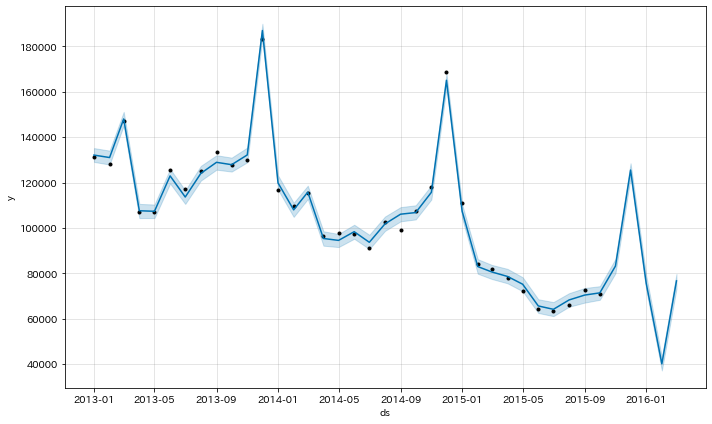

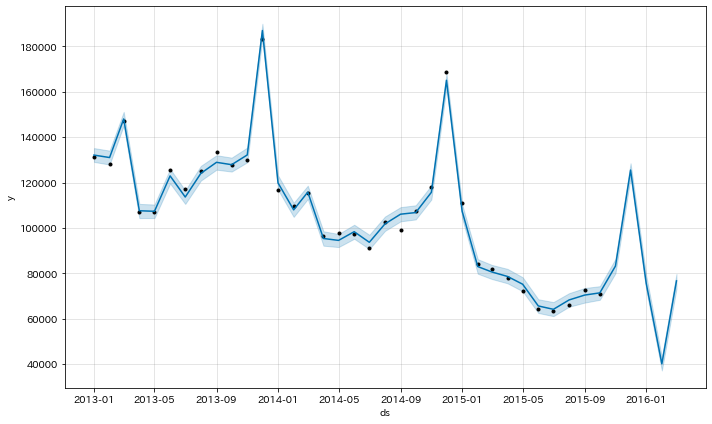

In [19]:
model.plot(forecast)

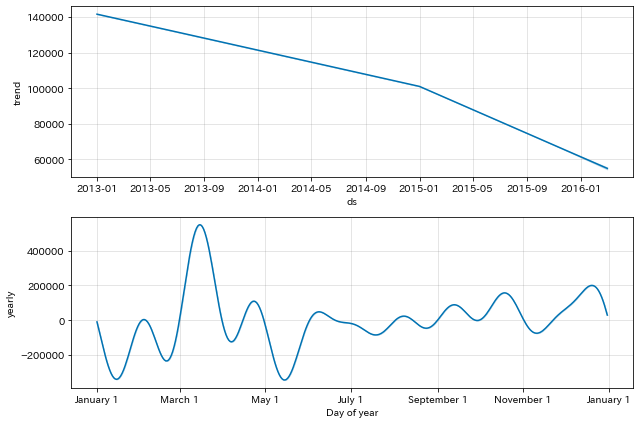

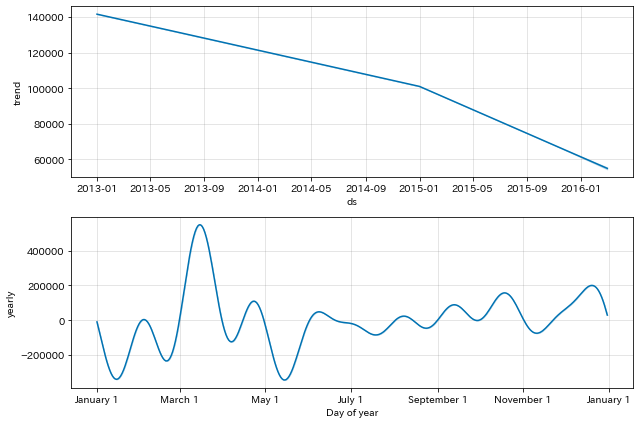

In [20]:
model.plot_components(forecast)

In [21]:
# date_block_numを日時型に変換する関数
def date_block_num_to_datetime(date_block_num):
    base_date = datetime.datetime(2013, 1, 1)
    return base_date + relativedelta(months=date_block_num)




In [22]:
df_sales_monthly = df_sales.groupby(['date_block_num','shop_id','item_id']).item_cnt_day.sum().reset_index()
df_sales_monthly['year_month'] = df_sales_monthly.date_block_num.apply(lambda x:date_block_num_to_datetime(x))
df_sales_monthly
# ↑めちゃ遅い、なんとかしたい

,date_block_num,shop_id,item_id,item_cnt_day,year_month
0,0,0,32,6.0,2013-01-01
1,0,0,33,3.0,2013-01-01
2,0,0,35,1.0,2013-01-01
3,0,0,43,1.0,2013-01-01
4,0,0,51,2.0,2013-01-01
...,...,...,...,...,...
1609119,33,59,22087,6.0,2015-10-01
1609120,33,59,22088,2.0,2015-10-01
1609121,33,59,22091,1.0,2015-10-01
1609122,33,59,22100,1.0,2015-10-01


### 商品ごとに売上を予測する。

In [23]:
# 月・商品で集約する。
df_merged = pd.merge(df_test,df_sales,how='inner',on=['item_id','shop_id'])
df_item_monthly = df_merged.groupby(['date_block_num','item_id']).agg({'ID':'first','item_cnt_day':'sum'}).reset_index()
df_item_monthly['year_month'] = df_item_monthly.date_block_num.apply(lambda x:date_block_num_to_datetime(x))
df_item_monthly

,date_block_num,item_id,ID,item_cnt_day,year_month
0,0,32,5695,225.0,2013-01-01
1,0,33,12292,42.0,2013-01-01
2,0,42,42890,2.0,2013-01-01
3,0,45,47989,7.0,2013-01-01
4,0,51,6791,9.0,2013-01-01
...,...,...,...,...,...
68544,33,22162,42475,10.0,2015-10-01
68545,33,22163,899,26.0,2015-10-01
68546,33,22164,1342,15.0,2015-10-01
68547,33,22166,157428,11.0,2015-10-01


#### 不要な商品は対象外にする。

In [24]:
# 商品で集約する。
df_item_sum = df_item_monthly.groupby('item_id').agg({'year_month':['max','count']}).reset_index()
df_item_sum

item_id year_month      
                    max count
0         30 2015-10-01    33
1         31 2015-10-01    33
2         32 2015-10-01    34
3         33 2015-10-01    34
4         38 2015-09-01    14
...      ...        ...   ...
4711   22162 2015-10-01    10
4712   22163 2015-10-01     3
4713   22164 2015-10-01     9
4714   22166 2015-10-01    25
4715   22167 2015-10-01    26

[4716 rows x 3 columns]

In [25]:
# 2015年以降で販売されていない商品は対象外にする。
exclude_items = df_item_sum[df_item_sum[('year_month','max')] < '2015-01-01'].item_id.values
len(exclude_items)

113

In [26]:
# 半年以上の販売実績がない商品は対象外にする。
exclude_items_temp = df_item_sum[df_item_sum[('year_month','count')] < 6].item_id.values
exclude_items = np.r_[exclude_items,exclude_items_temp]
len(exclude_items)

1320

In [27]:
# 除外対象の商品を除外する。
df_item_monthly = df_item_monthly[~df_item_monthly.item_id.isin(exclude_items)]
df_item_monthly

,date_block_num,item_id,ID,item_cnt_day,year_month
0,0,32,5695,225.0,2013-01-01
1,0,33,12292,42.0,2013-01-01
2,0,42,42890,2.0,2013-01-01
3,0,45,47989,7.0,2013-01-01
4,0,51,6791,9.0,2013-01-01
...,...,...,...,...,...
68543,33,22154,43883,5.0,2015-10-01
68544,33,22162,42475,10.0,2015-10-01
68546,33,22164,1342,15.0,2015-10-01
68547,33,22166,157428,11.0,2015-10-01


In [28]:
# 商品の件数を確認する。
df_item_monthly.item_id.value_counts()

32       34
12795    34
12498    34
12536    34
12539    34
         ..
19765     6
1156      6
20408     6
9419      6
22102     6
Name: item_id, Length: 3439, dtype: int64

In [29]:
import time

def predict(item_id,df_item_monthly):
    
    print(f'[START]{item_id}')
    
    # item_idに紐づくデータを絞り込む
    df_item_monthly_temp = df_item_monthly[df_item_monthly.item_id == item_id]
    
    # 学習に必要なカラムに絞る。
    df_train = df_item_monthly_temp[['year_month','item_cnt_day']]
    df_train.columns = ['ds','y']
    # モデルを学習させる。
    model = Prophet(yearly_seasonality=True)
    model.fit(df_train)
    
    # 1年後まで予測結果を取得する。
    future = model.make_future_dataframe(periods=12,freq='MS')
    df_forecast = model.predict(future)
    
    # 2015-10の予測値を返却する。
    df_forecast = df_forecast[['ds','yhat','yhat_lower','yhat_upper']]
    df_forecast['item_id'] = item_id
    
    
    return df_forecast

In [ ]:
# Pandarallelの準備
from pandarallel import pandarallel
pandarallel.initialize()


list_df_pred = df_item_monthly['item_id'].drop_duplicates().parallel_apply(lambda x:predict(x,df_item_monthly))

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.
[START]32[START]10943
[START]3732[START]22092
[START]17963[START]15151[START]6252[START]3216






Initial log joint probability = -61.6177

Initial log joint probability = -57.2974

Initial log joint probability = -54.903

Initial log joint probability = -48.0396

Initial log joint probability = -65.1735

Initial log joint probability = -66.4989

Initial log joint probability = -47.7899

Initial log joint probability = -46.8088
Iteration  1. Log joint probability =    3.81585. Improved by 70.3147.
Iteration  1. Log joint probability =    14.6831. Improved by 71.9806.
Iteration  1. Log joint probability =    10.8171. Improved by 72.4348.
Iteration  1. Log joint probability =    5.26422. Improved by 70.4377.
Iteration  1. Log joint probability =    15.1755. Improved by 70.0785.
Iteration  1. Log joint probability =    20

In [ ]:
list_df_pred

In [ ]:
df_pred = pd.concat(list(list_df_pred)).reset_index()
# df_pred.columns = ['item_id','yhat']
df_pred

In [ ]:
df_pred.to_csv('pred.csv',index=False)

In [ ]:
! ls
